In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
print("hello")

# Load .pts files
def load_pts_file(filepath):
    with open(filepath, 'r') as file:
        lines = file.readlines()
        points = []
        for line in lines[3:-1]:  # skip header lines
            x, y = line.strip().split()
            points.append((float(x), float(y)))
        return np.array(points)

# Load data from images and .pts files
def load_data(images_folder, pts_folder):
    image_data = []
    keypoints = []
    for pts_file in os.listdir(pts_folder):
        if pts_file.endswith('.pts'):
            base_name = os.path.splitext(pts_file)[0]
            image_path = os.path.join(images_folder, base_name + '.jpg')
            pts_path = os.path.join(pts_folder, pts_file)

            if os.path.exists(image_path):
                image = cv2.imread(image_path, cv2.IMREAD_COLOR)
                image = cv2.resize(image, (250, 300))
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image_data.append(image / 255.0)  # normalize image
                points = load_pts_file(pts_path)
                print(f"Loaded {pts_file} with {len(points)} points.")

                # Normalize keypoints
                points[:, 0] /= image.shape[1]  # normalize x
                points[:, 1] /= image.shape[0]  # normalize y
                keypoints.append(points.flatten())  # flatten
    return np.array(image_data), np.array(keypoints)

# Load your data
images_folder = "/content/drive/MyDrive/asm_data/frontalimages_spatiallynormalized"
pts_folder = "/content/drive/MyDrive/asm_data/frontalshapes_manuallyannotated_46points"

images, keypoints = load_data(images_folder, pts_folder)

hello
Loaded 1b.pts with 46 points.
Loaded 2a.pts with 46 points.
Loaded 2b.pts with 46 points.
Loaded 3a.pts with 46 points.
Loaded 3b.pts with 46 points.
Loaded 4a.pts with 46 points.
Loaded 4b.pts with 46 points.
Loaded 5a.pts with 46 points.
Loaded 5b.pts with 46 points.
Loaded 7b.pts with 46 points.
Loaded 8a.pts with 46 points.
Loaded 8b.pts with 46 points.
Loaded 9a.pts with 46 points.
Loaded 9b.pts with 46 points.
Loaded 10a.pts with 46 points.
Loaded 10b.pts with 46 points.
Loaded 11a.pts with 46 points.
Loaded 11b.pts with 46 points.
Loaded 12a.pts with 46 points.
Loaded 12b.pts with 46 points.
Loaded 13a.pts with 46 points.
Loaded 13b.pts with 46 points.
Loaded 14a.pts with 46 points.
Loaded 14b.pts with 46 points.
Loaded 15a.pts with 46 points.
Loaded 15b.pts with 46 points.
Loaded 16a.pts with 46 points.
Loaded 16b.pts with 46 points.
Loaded 17a.pts with 46 points.
Loaded 17b.pts with 46 points.
Loaded 18a.pts with 46 points.
Loaded 18b.pts with 46 points.
Loaded 19a.pts w

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(images, keypoints, test_size=0.01, random_state=42)

In [ ]:
def build_model():
    model = Sequential([
        Conv2D(64, (3, 3), activation='relu', input_shape=X_train[0].shape),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.2),
        Dense(1024, activation='relu'),
        Dropout(0.2),
        Dense(len(y_train[0]), activation='linear')  # Output layer: 2N keypoints
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=['mse'])
    return model

model = build_model()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Define a checkpoint callback to save the best model
checkpoint_path = "/content/drive/MyDrive/asm_data/checkpoints/checkpoint_combined_dataset.keras"
checkpoint = ModelCheckpoint(
    checkpoint_path,
    monitor="val_loss",
    save_best_only=True,
    save_weights_only=False,
    mode="min",
    verbose=1
)

# Optional: Add early stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=4,  # Stop training if val_loss doesn't improve for 10 epochs
    mode="min",
    verbose=1
)


In [ ]:
history = model.fit(
    X_train,
    y_train,
    validation_split=0.3,
    epochs=100,
    batch_size=32,
    callbacks=[checkpoint, early_stopping]
)

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 686ms/step - loss: 3.5357 - mse: 3.5357
Epoch 1: val_loss improved from inf to 0.05292, saving model to /content/drive/MyDrive/asm_data/checkpoints/checkpoint_combined_dataset.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - loss: 3.4107 - mse: 3.4107 - val_loss: 0.0529 - val_mse: 0.0529
Epoch 2/100
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0643 - mse: 0.0643
Epoch 2: val_loss improved from 0.05292 to 0.01420, saving model to /content/drive/MyDrive/asm_data/checkpoints/checkpoint_combined_dataset.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 875ms/step - loss: 0.0627 - mse: 0.0627 - val_loss: 0.0142 - val_mse: 0.0142
Epoch 3/100
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0273 - mse: 0.0273
Epoch 3: val_loss did not improve from 0.01420
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.0318 - val_mse: 0.0318
Epoch 4/100
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0271 - mse: 0.0271
Epoch 4: val_loss

In [ ]:
loss, mse = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss}, Test MSE: {mse}")

# Predict keypoints
predictions = model.predict(X_train)

# Display predictions
for i in range(len(X_train)):  # Visualize all test images
    visualize_keypoints(X_train[i], y_train[i], predictions[i])
    print(predictions[i])




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0018 - mean_squared_error: 0.0018
Test Loss: 0.0017566023161634803, Test MSE: 0.0017566023161634803
17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step


NameError: name 'visualize_keypoints' is not defined

In [ ]:
# Save the model
model.save("/content/drive/MyDrive/asm_data/model/facial_keypoints_model_combined_dataset.h5")


# **START HERE**

In [ ]:
def resize_keypoints(keypoints, dimensions=[250, 300]):
    # Convert normalized keypoints back to the resized image dimensions
    return keypoints.reshape(-1, 2) * dimensions  # Scale keypoints to resized dimensions

def visualize_keypoints(image, keypoints, predicted_keypoints, resize=True, debug=False, show=True):
    if resize:
      keypoints = resize_keypoints(keypoints)
      predicted_keypoints = resize_keypoints(predicted_keypoints)
    # if debug:
    #   print(f"hello this is the keypoints matrix\n{predicted_keypoints}")
    # keypoints = keypoints.reshape(-1, 2) * [250, 300]  # Scale keypoints to resized dimensions
    # predicted_keypoints = predicted_keypoints.reshape(-1, 2) * [250, 300]

    # Display the image
    if show:
      plt.imshow(image)
      plt.scatter(keypoints[:, 0], keypoints[:, 1], c='blue', label='Ground Truth', s=12)  # Ground truth
      plt.scatter(predicted_keypoints[:, 0], predicted_keypoints[:, 1], c='red', label='Prediction', s=10)  # Predictions
      plt.legend()
      plt.axis("off")
      plt.show()
    return predicted_keypoints

In [ ]:
# Load and use the model for inference
from tensorflow.keras.models import load_model
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio

def apply_asm(imagepath):
    loaded_model = load_model("/content/drive/MyDrive/asm_data/model/facial_keypoints_model_even_more_data.h5")
    new_image = cv2.imread(imagepath)
    new_image = new_image[...,::-1]
    new_image_resized = cv2.resize(new_image, (250, 300)) / 255.0
    new_image_keypoints = loaded_model.predict(np.expand_dims(new_image_resized, axis=0))
    new_image_keypoints_processed = visualize_keypoints(new_image_resized, new_image_keypoints[0], new_image_keypoints[0])
    return new_image_resized, new_image_keypoints_processed

def asm_predict(new_image, visualize=True, resize=True, show=True):
    loaded_model = load_model("/content/drive/MyDrive/asm_data/model/facial_keypoints_model_even_more_data.h5")
    new_image = cv2.imread(imagepath)
    new_image = cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB)
    if resize:
      new_image = cv2.resize(new_image, (250, 300)) / 255.0
    new_image_keypoints = loaded_model.predict(np.expand_dims(new_image, axis=0))
    new_image_keypoints_processed = visualize_keypoints(new_image, new_image_keypoints[0], new_image_keypoints[0], show=show)
    return new_image, new_image_keypoints_processed

imagepath = "/content/drive/MyDrive/asm_data/frontalimages_spatiallynormalized/100a.jpg"
apply_asm(imagepath)


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/content/drive/MyDrive/asm_data/model/facial_keypoints_model_even_more_data.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
def generate_hair_points(hair_style, num_points=46):
  image, points = apply_asm(hair_style)
  with open(f"/content/drive/MyDrive/asm_data/hair/{str(hair_style.split('/')[-1])}.pts", "x") as f:
    f.write("version: 1\n")
    f.write("n_points: 46\n")
    f.write("{\n")
    for point in points:
      f.write(f"{point[0]} {point[1]}\n")
    f.write("}\n")
  return points
import time


def manual_hair_points(hair_style, sx=1, sy=1, x=0, y=0):
    image, points = apply_asm(hair_style)
    plt.show()
    time.sleep(2)
    inp = "hello"
    points[:, 0] *= float(sx)
    points[:, 1] *= float(sy)
    points[:, 0] += float(x)
    points[:, 1] += float(y)
    while inp != "q":
      inp = str(input("stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]\n"))
      match inp:
        case "sx":
          tempsx = float(input("Enter stretch factor: "))
          points[:, 0] *= float(tempsx)
          sx *= tempsx
        case "sy":
          tempsy = float(input("Enter stretch factor: "))
          points[:, 1] *= float(tempsy)
          sy *= tempsy
        case "x":
          tempx = float(input("Enter translation factor:"))
          points[:, 0] += tempx
          x += tempx
        case "y":
          tempy = float(input("Enter translation factor:"))
          points[:, 1] += tempy
          y += tempy
        case "skip":
          return sx, sy, x, y
        case "q":
          break
        case _:
          print("Invalid input")
      plt.imshow(image)
      plt.scatter(points[:, 0], points[:, 1], c='blue', label='Points', s=12)
      plt.legend()
      plt.axis("off")
      plt.show()
      time.sleep(0.1)
    print(f"sx: {sx}, sy: {sy}, x: {x}, y: {y}")
    with open(f"/content/drive/MyDrive/asm_data/frontalshapes_manuallyannotated_46points/{str(hair_style.split('/')[-1])}.pts", "w") as f:
      f.write("version: 1\n")
      f.write("n_points: 46\n")
      f.write("{\n")
      for point in points:
        f.write(f"{point[0]} {point[1]}\n")
      f.write("}\n")
    cv2.imwrite(f"/content/drive/MyDrive/asm_data/frontalimages_spatiallynormalized/{str(hair_style.split('/')[-1])}.jpg", (image*255).astype(np.uint8))
    print("written")
    try:
      os.remove(hair_style)
      print("removed")
    except:
      print("remove failed")
    return sx, sy, x, y

Screenshot 2024-12-04 at 4.01.16 PM.png


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


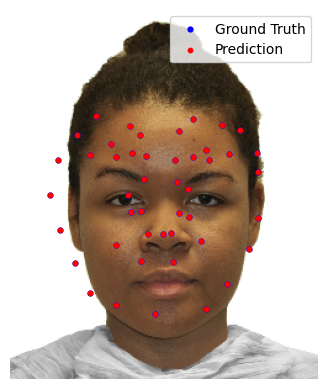

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 0.9


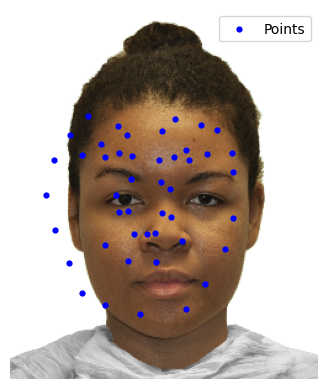

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:20


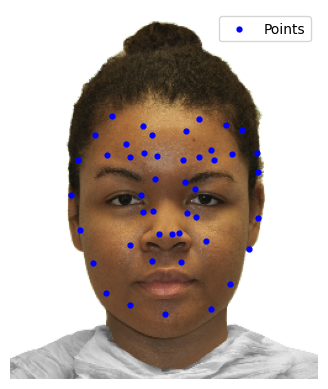

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 0.9


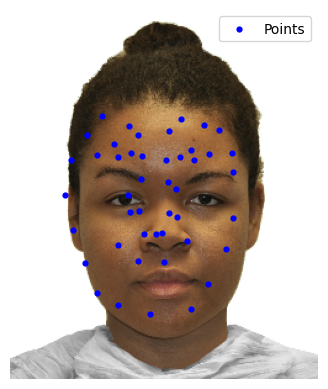

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:10


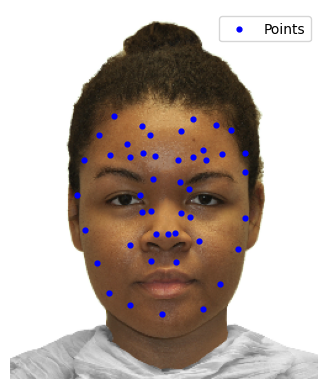

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 0.85


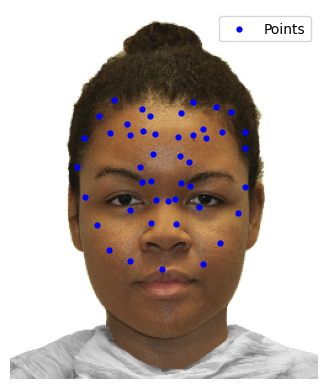

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:20


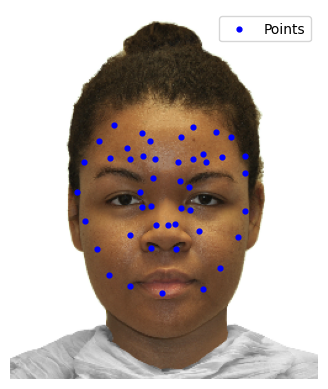

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:30


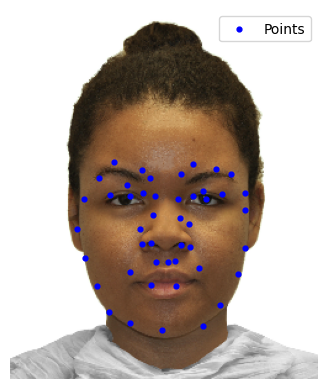

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 0.95


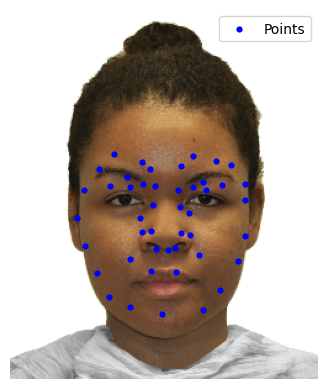

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:15


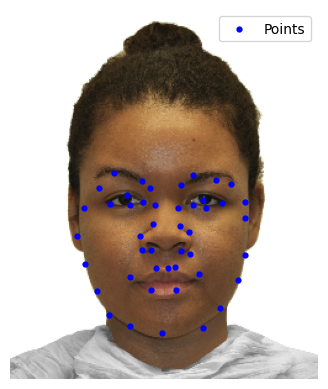

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.81, sy: 0.8075, x: 30.0, y: 65.0
written
removed
Screenshot 2024-12-04 at 4.01.33 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


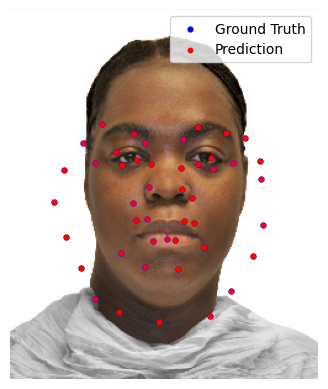

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


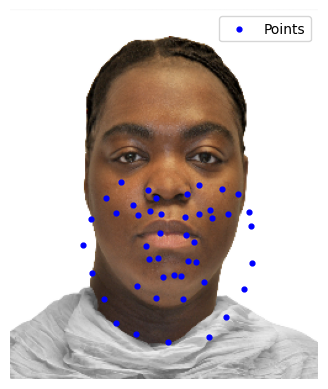

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 0.8


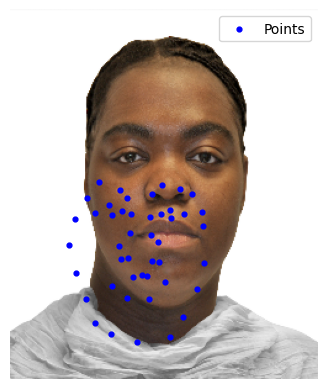

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:-40


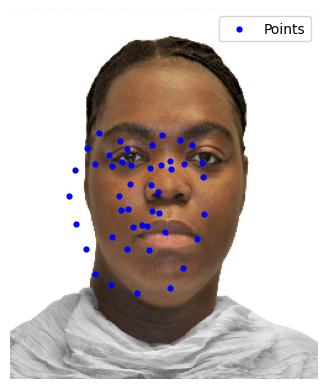

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:30


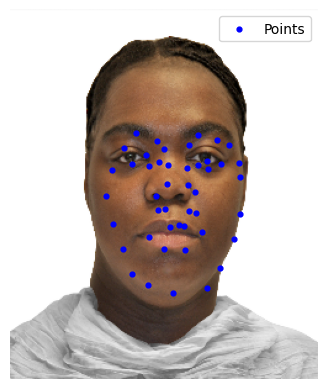

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:-20


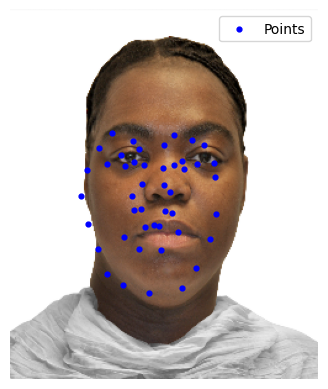

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.09


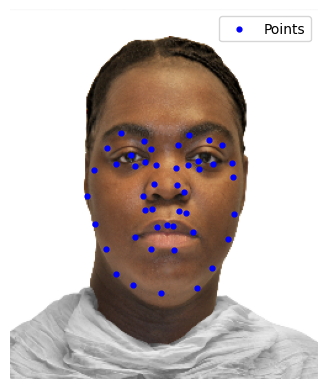

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.02


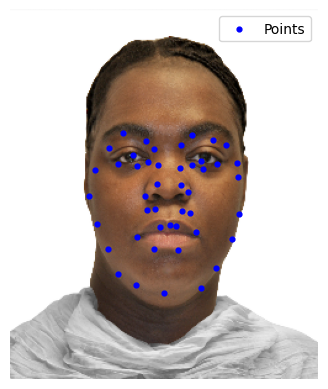

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.7204464000000002, sy: 0.8075, x: 40.0, y: 25.0
written
removed
Screenshot 2024-12-04 at 4.01.48 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


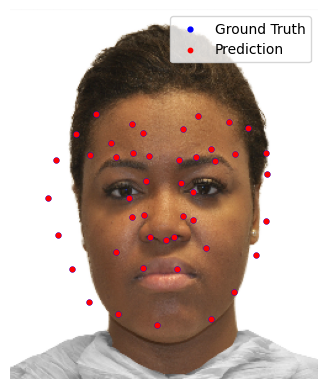

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


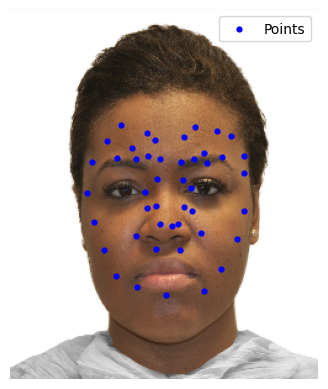

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:30


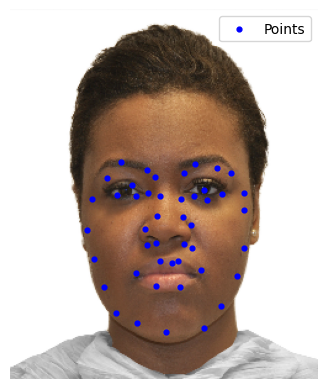

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.7204464000000002, sy: 0.8075, x: 40.0, y: 55.0
written
removed
Screenshot 2024-12-04 at 4.02.02 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


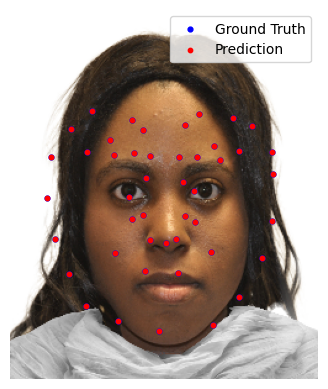

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


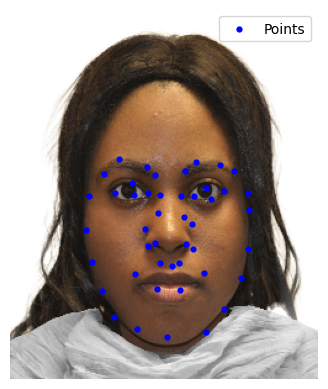

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.7204464000000002, sy: 0.8075, x: 40.0, y: 55.0
written
removed
Screenshot 2024-12-04 at 4.02.20 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


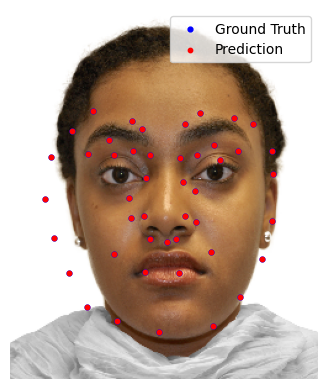

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


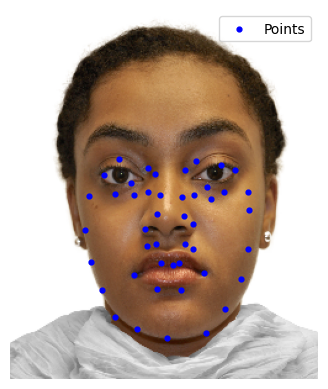

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 1.1


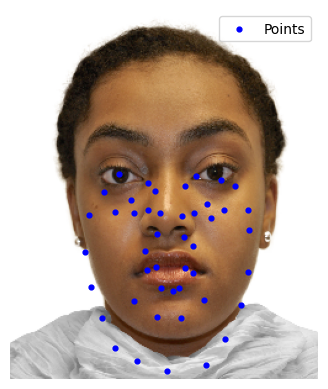

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:-20


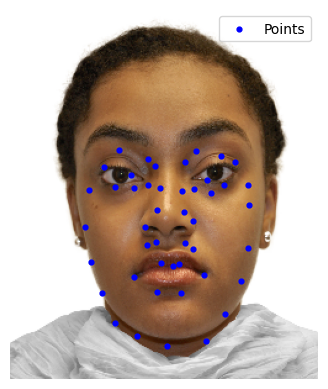

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:-20


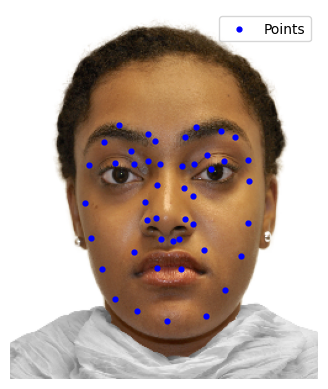

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 1.05


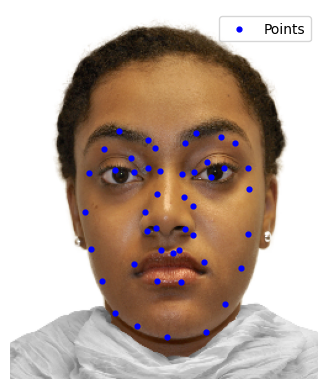

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.05


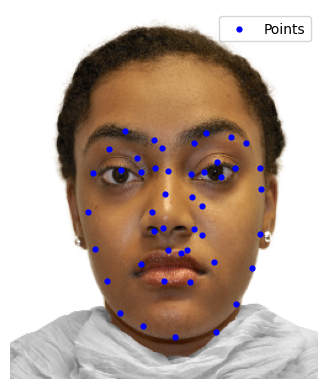

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.05


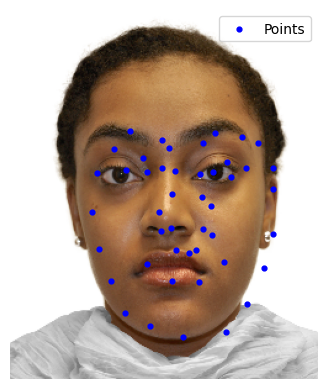

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:-10


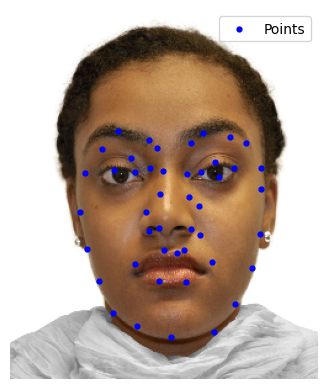

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.7942921560000002, sy: 0.9326625000000002, x: 30.0, y: 15.0
written
removed
Screenshot 2024-12-04 at 4.02.37 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


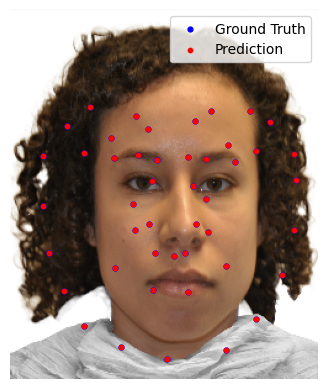

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


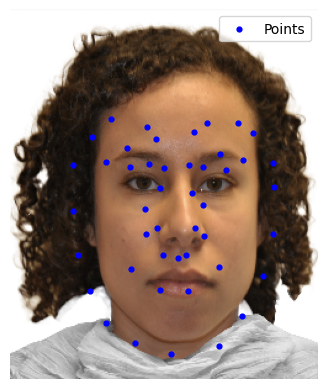

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 0.8


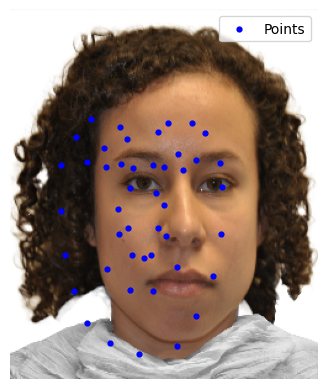

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 0.8


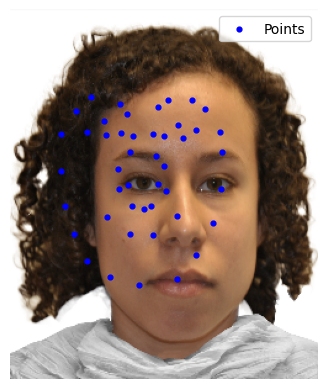

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:30


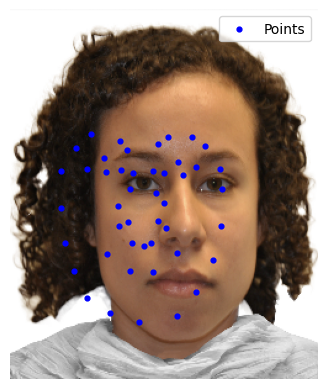

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:5


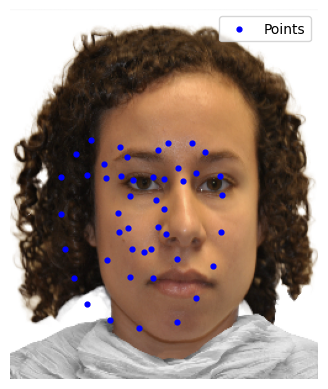

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:28


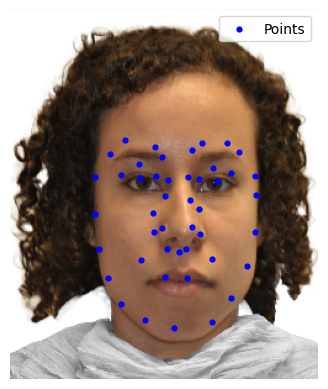

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:5


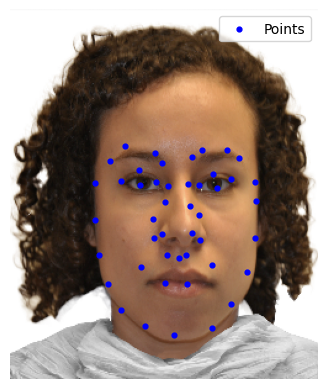

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.6354337248000003, sy: 0.7461300000000002, x: 58.0, y: 55.0
written
removed
Screenshot 2024-12-04 at 4.02.50 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


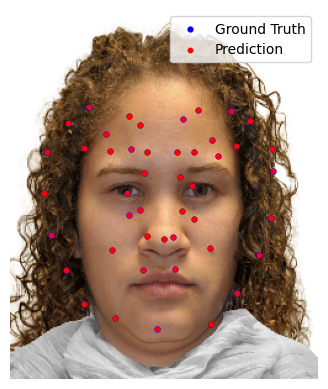

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


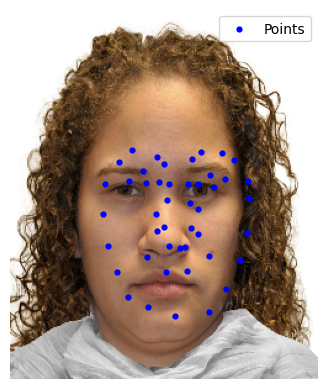

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 1.05


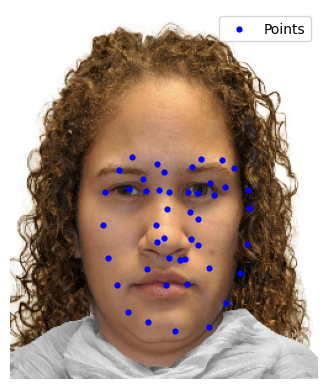

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:-15


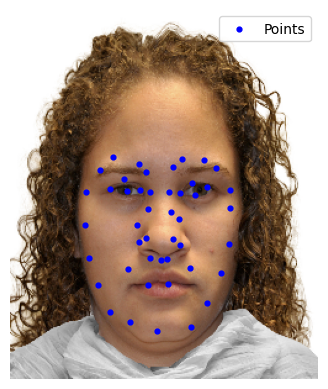

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:5


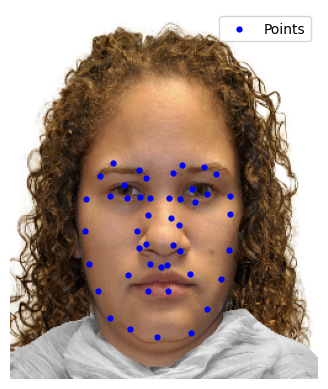

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.6354337248000003, sy: 0.7834365000000002, x: 43.0, y: 60.0
written
removed
Screenshot 2024-12-04 at 4.03.11 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


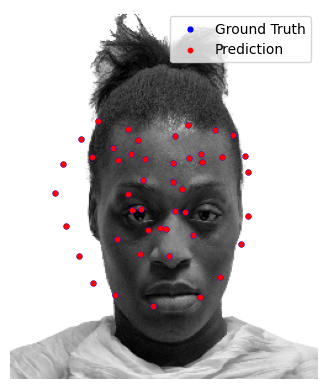

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


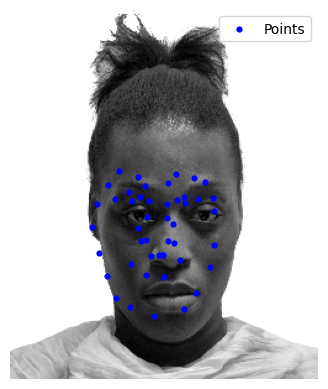

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.1


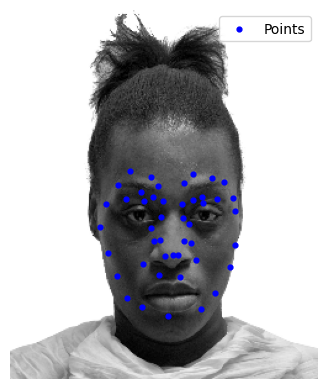

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 1.05


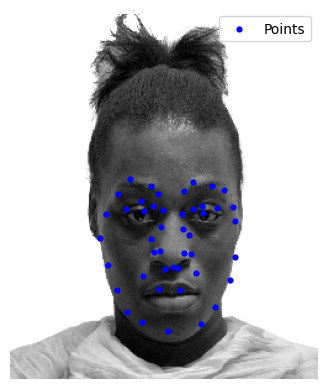

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 1.01


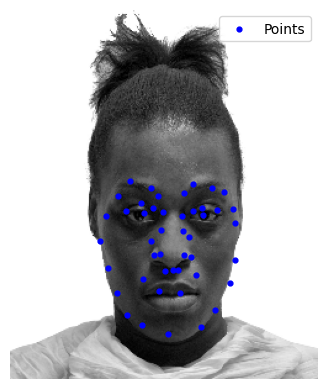

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.6989770972800003, sy: 0.8308344082500002, x: 43.0, y: 60.0
written
removed
Screenshot 2024-12-04 at 4.03.34 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


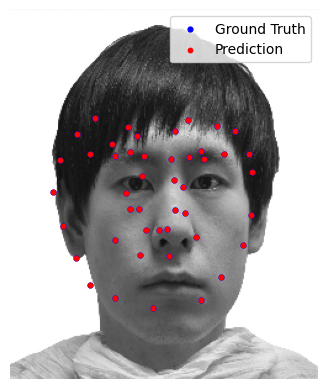

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


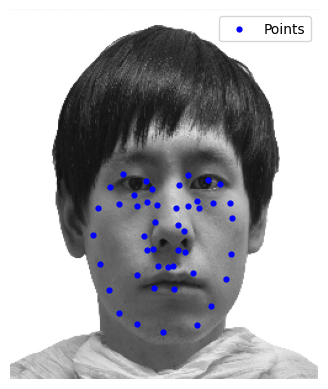

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.1


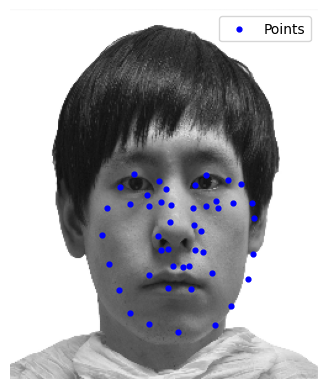

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:-10


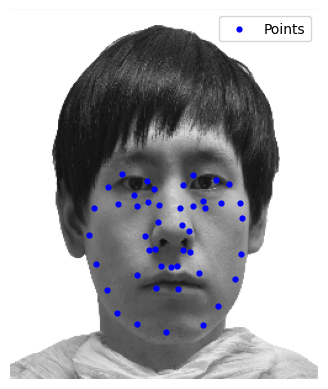

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 1.1


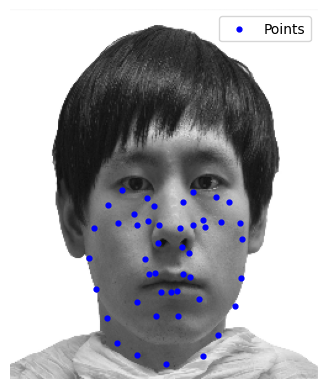

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:-20


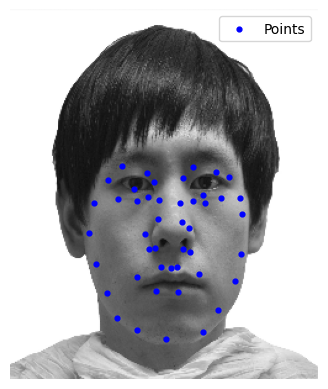

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.7688748070080005, sy: 0.9139178490750003, x: 33.0, y: 40.0
written
removed
Screenshot 2024-12-04 at 4.03.50 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


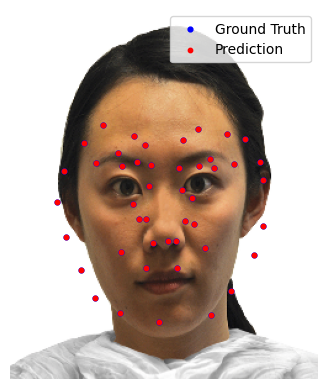

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 0.9


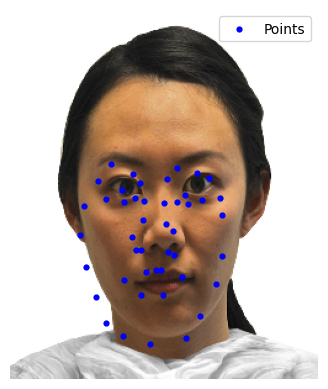

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:5


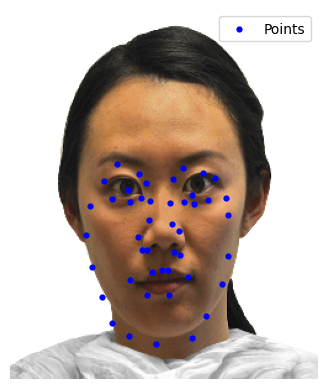

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 1.05


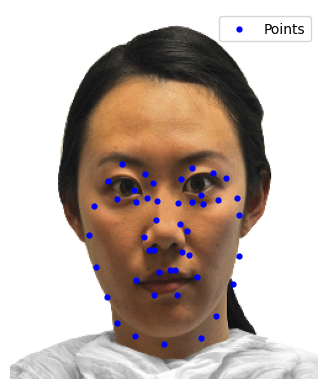

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 0.98


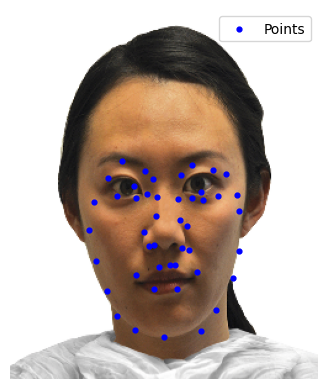

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.7265866926225606, sy: 0.8956394920935002, x: 38.0, y: 40.0
written
removed
Screenshot 2024-12-04 at 4.04.04 PM.png


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


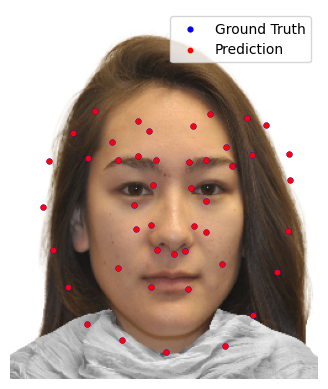

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
j
Invalid input


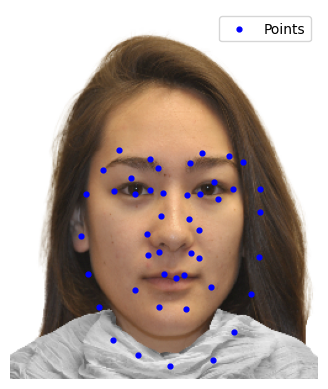

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sx
Enter stretch factor: 0.9


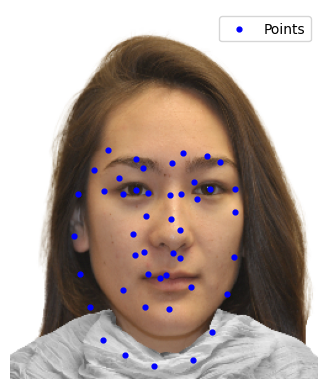

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
sy
Enter stretch factor: 0.8


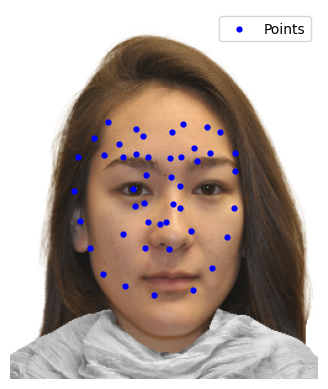

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:20


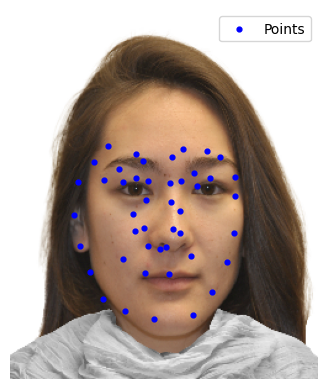

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:5


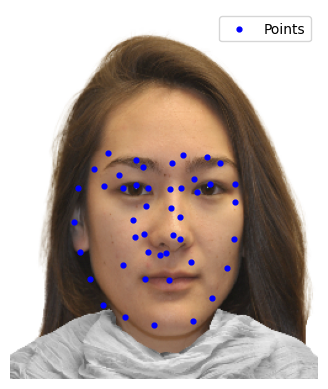

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:5


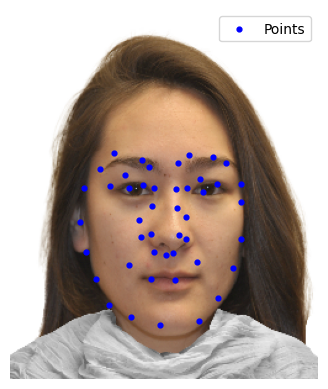

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
y
Enter translation factor:4


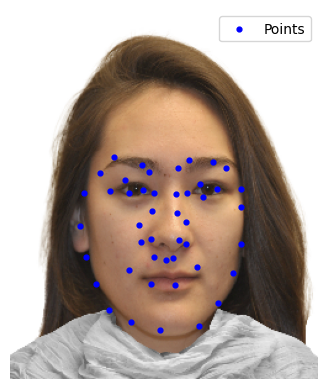

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
x
Enter translation factor:4


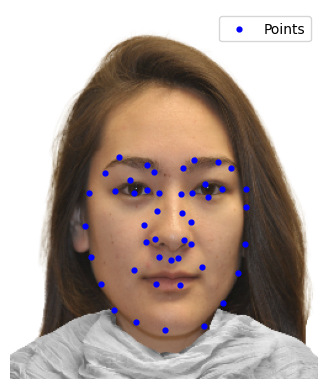

stretch x? [sx] stretch y? [sy] translate x? [x] translate y? [y] quit? [q]
q
sx: 0.6539280233603045, sy: 0.7165115936748002, x: 47.0, y: 69.0
written
removed


In [ ]:
import os
# generate_hair_points("/content/drive/MyDrive/asm_data/hair/picture/quiff.png")
sx = 1
sy = 1
x = 0
y = 0
# combining the fei, faces, RADIATE poc, and custom data i got from online
for i in os.listdir("/content/drive/MyDrive/asm_data/special_data"):
  if i.endswith(".png"):
    print(i)
    sx, sy, x, y = manual_hair_points("/content/drive/MyDrive/asm_data/special_data/" + i, sx, sy, x, y)

In [ ]:

from tensorflow.keras.models import load_model
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio

print("Model, Loss, MSE")

for i in os.listdir("/content/drive/MyDrive/asm_data/model"):
  try:
    model = load_model("/content/drive/MyDrive/asm_data/model/" + i)
    loss, mse = model.evaluate(X_test, y_test)
    print(f"{i}, {loss}, {mse}")
  except:
    print(f"failed on {i},")

Model, Loss, MSE


failed on facial_keypoints_model.h5,


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - loss: 0.0081 - mean_squared_error: 0.0081
facial_keypoints_model_20.h5, 0.008078486658632755, 0.008078486658632755


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0036 - mean_squared_error: 0.0036
facial_keypoints_model_50.h5, 0.0036413297057151794, 0.0036413297057151794


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - loss: 0.0026 - mean_squared_error: 0.0026
facial_keypoints_model_64plus.h5, 0.002600356936454773, 0.002600356936454773


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - loss: 0.0044 - mean_squared_error: 0.0044
facial_keypoints_model_less_epochs.h5, 0.00438228202983737, 0.00438228202983737


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0012 - mean_squared_error: 0.0012
facial_keypoints_model_more_data.h5, 0.0012292572064325213, 0.0012292572064325213


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


failed on facial_keypoints_model_even_more_data.h5,


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step - loss: 0.0018 - mean_squared_error: 0.0018
facial_keypoints_model_combined_dataset.h5, 0.0017566023161634803, 0.0017566023161634803


In [ ]:
!pip install rembg
!pip install onnxruntime

ERROR: Operation cancelled by user
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 109.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.0 MB/s eta 0:00:00


# Data Preprocessing

In [ ]:
import imageio.v3
import io
import matplotlib.pyplot as plt
from skimage.transform import resize
from rembg import remove

def take_input(filepath):
    with open(filepath, 'rb') as f:
        input_img = f.read()

    # remove background image
    img_no_bg = remove(input_img)

    # reconvert to NumPy array
    img = imageio.v3.imread(io.BytesIO(img_no_bg), format_hint=".png")
    # img = imageio.v3.imread(filepath)

    if img.ndim == 2:  # grayscale image
        img = np.stack((img,) * 3, axis=-1)
    elif img.shape[-1] == 4:  # alpha
        img = img[..., :3]

    img = resize(img, (300, 250, 3), mode='reflect', anti_aliasing=True).astype('float32')
    return img

image = take_input("/content/drive/MyDrive/asm_data/frontalimages_spatiallynormalized/100a.jpg")
plt.imshow(image)

In [ ]:
import cv2

def take_camera_input(output_file='camera_out.jpg'):
    # Open the camera
    camera = cv2.VideoCapture(0)
    if not camera.isOpened():
        print("Error: Unable to access the camera.")
        return

    print("Camera is ready. Press 'q' to quit.")

    captured_frame = None
    while True:
        # Read frame from the camera
        ret, frame = camera.read()
        if not ret:
            print("Error: Unable to read from the camera.")
            break

        # Convert frame to RGB for matplotlib
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display the frame using matplotlib
        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.show(block=False)
        plt.pause(0.001)

        # Prompt user for input
        user_input = input("Press 'c' to capture an image, 'a' to take another frame, or 'q' to quit: ").strip().lower()
        if user_input == 'c':
            captured_frame = resize(frame, (300, 250, 3), mode='reflect', anti_aliasing=True).astype('float32')
            print(f"Image captured and saved to {output_file}")
            break
        elif user_input == 'a':
            continue
        elif user_input == 'q':
            print("Quit without capturing.")
            break

        # NOTE: doesn't work on jupyter notebooks
        # # Check for user input
        # user_input = plt.waitforbuttonpress(timeout=0)
        # if user_input:
        #     # Get the key pressed
        #     key = plt.get_current_fig_manager().canvas.manager.keypress
        #     if key == 'c':
        #         # Capture the current frame
        #         captured_frame = frame
        #         print(f"Image captured and saved to {output_file}")
        #         break
        #     elif key == 'q':
        #         # Quit without capturing
        #         print("Quit without capturing.")
        #         break

    # Save the captured frame if available
    if captured_frame is not None:
        cv2.imwrite(output_file, captured_frame)

    # Release the camera
    camera.release()
    plt.close()
    return captured_frame

take_camera_input()

# ASM Transformation

In [ ]:
import numpy as np
from scipy.spatial import procrustes
import cv2
import matplotlib.pyplot as plt

def order_points(points):
    centroid = np.mean(points, axis=0)  # centroid

    angles = np.arctan2(points[:, 1] - centroid[1], points[:, 0] - centroid[0])  # angle about the centroid

    distances = np.linalg.norm(points - centroid, axis=1)  # distance to centroid

    # sort by angle first, then distance
    criteria = np.column_stack((angles, distances))
    ordered_indices = np.lexsort((criteria[:, 1], criteria[:, 0]))
    ordered_points = points[ordered_indices]

    return ordered_points

def align_points(ground_truth, predicted):
    # 1) Order the points in both sets
    ground_truth_ordered = order_points(ground_truth)
    predicted_ordered = order_points(predicted)

    # 2) Compute the centroid of the ground truth
    ground_truth_centroid = np.mean(ground_truth_ordered, axis=0)
    predicted_centroid = np.mean(predicted_ordered, axis=0)

    # 3) Procrustes analysis for similarity transformation
    ground_truth_centered = ground_truth_ordered - ground_truth_centroid
    predicted_centered = predicted_ordered - predicted_centroid

    _, aligned_predicted, similarity_disparity = procrustes(ground_truth_centered, predicted_centered)

    # 4) Restore the aligned predicted points to the ground truth centroid
    aligned_predicted += ground_truth_centroid

    # 5) Homography transformation for finer alignment
    homography_matrix, _ = cv2.findHomography(aligned_predicted, ground_truth_ordered, cv2.RANSAC)
    aligned_predicted_homo = np.hstack((aligned_predicted, np.ones((aligned_predicted.shape[0], 1))))  # Homogeneous coordinates
    aligned_points_homo = aligned_predicted_homo @ homography_matrix.T
    aligned_points = aligned_points_homo[:, :2] / aligned_points_homo[:, 2:]  # Back to Cartesian coordinates

    return aligned_points, similarity_disparity, homography_matrix

def plot_transformations(ground_truth, predicted, predicted_aligned, similarity_disparity):
  plt.figure(figsize=(8, 6))
  plt.scatter(ground_truth[:, 0], ground_truth[:, 1], label='Ground Truth (Unordered)', c='blue', marker='o')
  plt.scatter(predicted[:, 0], predicted[:, 1], label='Predicted (Unordered)', c='red', marker='x')
  plt.scatter(predicted_aligned[:, 0], predicted_aligned[:, 1], label='Predicted (Aligned)', c='green', marker='+')
  plt.legend()
  plt.title(f"Alignment with Combined Ordering\nSimilarity Disparity: {similarity_disparity:.4f}")
  plt.xlabel("X-axis")
  plt.ylabel("Y-axis")
  plt.axis('equal')
  plt.show()

In [ ]:
# Example points
ground_truth = np.array([[1, 1], [2, 0], [0, 0], [1, -1]])  # Unordered square
predicted = np.array([[0.8, 0.9], [1.9, -0.1], [0.1, -0.1], [1.1, -1.1]])  # Unordered offset square

# Align the points
predicted_aligned, similarity_disparity, homography_matrix = align_points(ground_truth, predicted)

# Plots
plot_transformations(ground_truth, predicted, predicted_aligned, similarity_disparity)

In [ ]:
image_path = "/content/drive/MyDrive/asm_data/frontalimages_spatiallynormalized/100a.jpg"
points_path = "/content/drive/MyDrive/asm_data/frontalshapes_manuallyannotated_46points/100a.pts"
image, predicted_points = apply_asm(image_path)
ground_truth_points = load_pts_file(points_path)

# Align the points
# predicted_aligned, similarity_disparity, homography_matrix = align_points(ground_truth_points, predicted_points)
predicted_aligned, similarity_disparity, homography_matrix = align_points(predicted_points, ground_truth_points)

 # Plots (plots upside down because origin is at the bottom left but in images its at the top left)
plot_transformations(ground_truth_points, predicted_points, predicted_aligned, similarity_disparity)

# Visualize
visualize_keypoints(image, ground_truth_points, predicted_aligned, resize=False)

# Interface

In [ ]:
from time import sleep

# Test interface with this file
# /content/drive/MyDrive/asm_data/frontalimages_spatiallynormalized/100a.jpg

def ilyc_interface():
    '''
    Interface for program.
    Prompts user to input image filepath or use camera option
    Then, applies preprocessing to bring size to (250, 300, 3) and remove background
    '''
    instructions = '''
    For best results, please adhere to the following guidelines:
      1) Image must be front facing
      2) Image must be mostly your face
      3) Preferrably no smiling
    '''
    print(instructions)
    image_mode = input("Select input mode. Press 'c' to use your computer camera, 'f' to enter a filepath, or 'q' to quit: ")
    if image_mode == 'c':
        filepath = 'camera_out.jpg'
        img = take_camera_input(filepath)
    elif image_mode == 'f':
        filepath = input("Enter your filepath: ")
        img = take_input(filepath)
    elif image_mode == 'q':
        return
    else:
        ilyc_interface()
        return

    # Preview image and prompt for validity
    plt.imshow(img)
    plt.show()
    sleep(2)  # there's some delay for showing the image --> this accounts for it
    valid_input = input("Is this a valid picture? (y/n) ")
    if valid_input.lower() != 'y':
        ilyc_interface()
        return

    # TODO: connect to Adam's face shape, prompt user for hairstyle
    hair_selection = "fade"  # TODO: replace with Adam's stuff
    hair_points = '/content/drive/MyDrive/asm_data/frontalshapes_manuallyannotated_46points/100a.pts'  # TODO: link hair_selection to ASM of that hair style
    ground_truth_points = load_pts_file(hair_points)  # TODO: replace points_path with the hairstyle points

    # Apply model to generate predicted ASM on inputted image
    resized_image, predicted_points = asm_predict(img, show=False)

    # Align the points
    predicted_aligned, similarity_disparity, homography_matrix = align_points(ground_truth_points, predicted_points)

    # Plots (plots upside down because origin is at the bottom left but in images its at the top left)
    # This is optional
    # plot_transformations(ground_truth_points, predicted_points, predicted_aligned, similarity_disparity)

    # Visualize
    visualize_keypoints(image, ground_truth_points, predicted_aligned, resize=False)

ilyc_interface()